### Import packages

In [2]:
import sys
sys.path.insert(0,'../..')
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"]="2"
import time
import matplotlib.pyplot as plt
%matplotlib inline
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
import torchattacks
import torchvision
from torchvision import transforms
from torchattacks.attack import Attack

### Import biotorch classes and functions

In [2]:
from biotorch.datasets.cifar import CIFAR10Benchmark
from biotorch.applications.adversarial_attacks.visualization import imshow, plot_accuracy
from biotorch.applications.adversarial_attacks.functions import add_data_normalization, apply_attack_on_dataset, apply_attack_on_batch 
from biotorch.layers.metrics import compute_matrix_angle

In [3]:
dataset = CIFAR10Benchmark(32, test_transforms=[
    transforms.transforms.Resize((32, 32)),
    transforms.ToTensor()])

cifar_mean = (0.4914, 0.4821, 0.4465)
cifar_std = (0.2470, 0.2435, 0.2616)

train_dataloader = dataset.create_train_dataloader(128)
val_dataloader = dataset.create_val_dataloader(128)
test_dataloader = dataset.create_test_dataloader(128)

Preparing CIFAR-10 Benchmark Dataset and storing data in ./datasets/cifar10
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


### Define the models

In [4]:
trained_models_directory = '../trained_models/CIFAR10/resnet-20'

bp_model_path   = os.path.join(trained_models_directory, 'bp/model_best_acc.pth')
fa_model_path   = os.path.join(trained_models_directory, 'fa/model_best_acc.pth')
dfa_model_path  = os.path.join(trained_models_directory, 'dfa/model_best_acc.pth')
sign_usf_model_path = os.path.join(trained_models_directory, 'sign_usf/model_best_acc.pth')
sign_frsf_model_path = os.path.join(trained_models_directory, 'sign_frsf/model_best_acc.pth')
sign_brsf_model_path = os.path.join(trained_models_directory, 'sign_brsf/model_best_acc.pth')

In [5]:
model_bp = torch.load(bp_model_path, map_location='cuda:0')
model_bp = add_data_normalization(model_bp, cifar_mean, cifar_std).eval()

model_fa = torch.load(fa_model_path, map_location='cuda:0')
model_fa = add_data_normalization(model_fa, cifar_mean, cifar_std).eval()

model_dfa = torch.load(dfa_model_path, map_location='cuda:0')
model_dfa = add_data_normalization(model_dfa, cifar_mean, cifar_std).eval()

model_sign_usf = torch.load(sign_usf_model_path, map_location='cuda:0')
model_sign_usf = add_data_normalization(model_sign_usf, cifar_mean, cifar_std).eval()

model_sign_frsf = torch.load(sign_frsf_model_path, map_location='cuda:0')
model_sign_frsf = add_data_normalization(model_sign_frsf, cifar_mean, cifar_std).eval()

model_sign_brsf = torch.load(sign_brsf_model_path, map_location='cuda:0')
model_sign_brsf = add_data_normalization(model_sign_brsf, cifar_mean, cifar_std).eval()


In [6]:
class APGD(Attack):
    r"""
    APGD in the paper 'Reliable evaluation of adversarial robustness with an ensemble of diverse parameter-free attacks'
    [https://arxiv.org/abs/2003.01690]
    [https://github.com/fra31/auto-attack]
    Distance Measure : Linf, L2
    Arguments:
        model (nn.Module): model to attack.
        norm (str): Lp-norm of the attack. ['Linf', 'L2'] (Default: 'Linf')
        eps (float): maximum perturbation. (Default: None)
        steps (int): number of steps. (Default: 100)
        n_restarts (int): number of random restarts. (Default: 1)
        seed (int): random seed for the starting point. (Default: 0)
        loss (str): loss function optimized. ['ce', 'dlr'] (Default: 'ce')
        eot_iter (int): number of iteration for EOT. (Default: 1)
        rho (float): parameter for step-size update (Default: 0.75)
        verbose (bool): print progress. (Default: False)
    Shape:
        - images: :math:`(N, C, H, W)` where `N = number of batches`, `C = number of channels`,        `H = height` and `W = width`. It must have a range [0, 1].
        - labels: :math:`(N)` where each value :math:`y_i` is :math:`0 \leq y_i \leq` `number of labels`.
        - output: :math:`(N, C, H, W)`.
        
    Examples::
        >>> attack = torchattacks.APGD(model, norm='Linf', eps=8/255, steps=100, n_restarts=1, seed=0, loss='ce', eot_iter=1, rho=.75, verbose=False)
        >>> adv_images = attack(images, labels)
    """
    def __init__(self, model, mode='bp', norm='Linf', eps=8/255, steps=50, n_restarts=1, 
                 seed=0, loss='ce', eot_iter=1, rho=.75, verbose=False):
        super().__init__("APGD", model)
        self.eps = eps
        self.steps = steps
        self.norm = norm
        self.n_restarts = n_restarts
        self.seed = seed
        self.loss = loss
        self.eot_iter = eot_iter
        self.thr_decr = rho
        self.verbose = verbose
        self._supported_mode = ['default']
        self.mode = mode

    def forward(self, images, labels):
        r"""
        Overridden.
        """
        images = images.clone().detach().to(self.device)
        labels = labels.clone().detach().to(self.device)
        _, adv_images = self.perturb(images, labels, cheap=True)

        return adv_images
    
    def check_oscillation(self, x, j, k, y5, k3=0.75):
        t = np.zeros(x.shape[1])
        for counter5 in range(k):
            t += x[j - counter5] > x[j - counter5 - 1]
          
        return t <= k*k3*np.ones(t.shape)
        
    def check_shape(self, x):
        return x if len(x.shape) > 0 else np.expand_dims(x, 0)
    
    def dlr_loss(self, x, y):
        x_sorted, ind_sorted = x.sort(dim=1)
        ind = (ind_sorted[:, -1] == y).float()
        
        return -(x[np.arange(x.shape[0]), y] - x_sorted[:, -2] * ind - x_sorted[:, -1] * (1. - ind)) / (x_sorted[:, -1] - x_sorted[:, -3] + 1e-12)
    
    def attack_single_run(self, x_in, y_in):
        x = x_in.clone() if len(x_in.shape) == 4 else x_in.clone().unsqueeze(0)
        y = y_in.clone() if len(y_in.shape) == 1 else y_in.clone().unsqueeze(0)
        
        self.steps_2, self.steps_min, self.size_decr = max(int(0.22 * self.steps), 1), max(int(0.06 * self.steps), 1), max(int(0.03 * self.steps), 1)
        if self.verbose:
            print('parameters: ', self.steps, self.steps_2, self.steps_min, self.size_decr)
        
        if self.norm == 'Linf':
            t = 2 * torch.rand(x.shape).to(self.device).detach() - 1
            x_adv = x.detach() + self.eps * torch.ones([x.shape[0], 1, 1, 1]).to(self.device).detach() * t / (t.reshape([t.shape[0], -1]).abs().max(dim=1, keepdim=True)[0].reshape([-1, 1, 1, 1]))
        elif self.norm == 'L2':
            t = torch.randn(x.shape).to(self.device).detach()
            x_adv = x.detach() + self.eps * torch.ones([x.shape[0], 1, 1, 1]).to(self.device).detach() * t / ((t ** 2).sum(dim=(1, 2, 3), keepdim=True).sqrt() + 1e-12)
        x_adv = x_adv.clamp(0., 1.)
        x_best = x_adv.clone()
        x_best_adv = x_adv.clone()
        loss_steps = torch.zeros([self.steps, x.shape[0]])
        loss_best_steps = torch.zeros([self.steps + 1, x.shape[0]])
        acc_steps = torch.zeros_like(loss_best_steps)
        
        if self.loss == 'ce':
            criterion_indiv = nn.CrossEntropyLoss(reduction='none')
        elif self.loss == 'dlr':
            criterion_indiv = self.dlr_loss
        else:
            raise ValueError('unknowkn loss')
        
        x_adv.requires_grad_()
        grad = torch.zeros_like(x)
        for _ in range(self.eot_iter):
            with torch.enable_grad():
                logits = self.model(x_adv) # 1 forward pass (eot_iter = 1)
                loss_indiv = criterion_indiv(logits, y)
                loss = loss_indiv.sum()
                
                if self.mode == 'DFA':
                    # Zero gradients
                    self.model.zero_grad()
                    loss_gradient = torch.autograd.grad(loss, logits, retain_graph=True)[0]
                    # Broadcast gradient of the loss to every layer
                    for layer in self.model[1].module.modules():
                        layer.loss_gradient = loss_gradient

                    loss.backward()
                    grad = x_adv.grad

                else:
                    grad += torch.autograd.grad(loss, [x_adv])[0].detach() # 1 backward pass (eot_iter = 1)
            
        grad /= float(self.eot_iter)
        grad_best = grad.clone()
        
        acc = logits.detach().max(1)[1] == y
        acc_steps[0] = acc + 0
        loss_best = loss_indiv.detach().clone()
        
        step_size = self.eps * torch.ones([x.shape[0], 1, 1, 1]).to(self.device).detach() * torch.Tensor([2.0]).to(self.device).detach().reshape([1, 1, 1, 1])
        x_adv_old = x_adv.clone()
        counter = 0
        k = self.steps_2 + 0
        u = np.arange(x.shape[0])
        counter3 = 0
        
        loss_best_last_check = loss_best.clone()
        reduced_last_check = np.zeros(loss_best.shape) == np.zeros(loss_best.shape)
        n_reduced = 0
        
        for i in range(self.steps):
            ### gradient step
            with torch.no_grad():
                x_adv = x_adv.detach()
                grad2 = x_adv - x_adv_old
                x_adv_old = x_adv.clone()
                
                a = 0.75 if i > 0 else 1.0
                
                if self.norm == 'Linf':
                    x_adv_1 = x_adv + step_size * torch.sign(grad)
                    x_adv_1 = torch.clamp(torch.min(torch.max(x_adv_1, x - self.eps), x + self.eps), 0.0, 1.0)
                    x_adv_1 = torch.clamp(torch.min(torch.max(x_adv + (x_adv_1 - x_adv) * a + grad2 * (1 - a), x - self.eps), x + self.eps), 0.0, 1.0)
                    
                elif self.norm == 'L2':
                    x_adv_1 = x_adv + step_size * grad / ((grad ** 2).sum(dim=(1, 2, 3), keepdim=True).sqrt() + 1e-12)
                    x_adv_1 = torch.clamp(x + (x_adv_1 - x) / (((x_adv_1 - x) ** 2).sum(dim=(1, 2, 3), keepdim=True).sqrt() + 1e-12) * torch.min(
                        self.eps * torch.ones(x.shape).to(self.device).detach(), ((x_adv_1 - x) ** 2).sum(dim=(1, 2, 3), keepdim=True).sqrt()), 0.0, 1.0)
                    x_adv_1 = x_adv + (x_adv_1 - x_adv) * a + grad2 * (1 - a)
                    x_adv_1 = torch.clamp(x + (x_adv_1 - x) / (((x_adv_1 - x) ** 2).sum(dim=(1, 2, 3), keepdim=True).sqrt() + 1e-12) * torch.min(
                        self.eps * torch.ones(x.shape).to(self.device).detach(), ((x_adv_1 - x) ** 2).sum(dim=(1, 2, 3), keepdim=True).sqrt() + 1e-12), 0.0, 1.0)
                    
                x_adv = x_adv_1 + 0.
            
            ### get gradient
            x_adv.requires_grad_()
            grad = torch.zeros_like(x)
            for _ in range(self.eot_iter):
                with torch.enable_grad():
                    logits = self.model(x_adv) # 1 forward pass (eot_iter = 1)
                    loss_indiv = criterion_indiv(logits, y)
                    loss = loss_indiv.sum()
                
                
                if self.mode == 'DFA':
                    # Zero gradients
                    self.model.zero_grad()
                    loss_gradient = torch.autograd.grad(loss, logits, retain_graph=True)[0]
                    # Broadcast gradient of the loss to every layer
                    for layer in self.model[1].module.modules():
                        layer.loss_gradient = loss_gradient

                    loss.backward()
                    grad = x_adv.grad
        
                else:
                    grad += torch.autograd.grad(loss, [x_adv])[0].detach() # 1 backward pass (eot_iter = 1)
                
            
            grad /= float(self.eot_iter)
            
            pred = logits.detach().max(1)[1] == y
            acc = torch.min(acc, pred)
            acc_steps[i + 1] = acc + 0
            x_best_adv[(pred == 0).nonzero().squeeze()] = x_adv[(pred == 0).nonzero().squeeze()] + 0.
            if self.verbose:
                print('iteration: {} - Best loss: {:.6f}'.format(i, loss_best.sum()))
            
            ### check step size
            with torch.no_grad():
                y1 = loss_indiv.detach().clone()
                loss_steps[i] = y1.cpu() + 0
                ind = (y1 > loss_best).nonzero().squeeze()
                x_best[ind] = x_adv[ind].clone()
                grad_best[ind] = grad[ind].clone()
                loss_best[ind] = y1[ind] + 0
                loss_best_steps[i + 1] = loss_best + 0
              
                counter3 += 1
          
                if counter3 == k:
                    fl_oscillation = self.check_oscillation(loss_steps.detach().cpu().numpy(), i, k, loss_best.detach().cpu().numpy(), k3=self.thr_decr)
                    fl_reduce_no_impr = (~reduced_last_check) * (loss_best_last_check.cpu().numpy() >= loss_best.cpu().numpy())
                    fl_oscillation = ~(~fl_oscillation * ~fl_reduce_no_impr)
                    reduced_last_check = np.copy(fl_oscillation)
                    loss_best_last_check = loss_best.clone()

                    if np.sum(fl_oscillation) > 0:
                        step_size[u[fl_oscillation]] /= 2.0
                        n_reduced = fl_oscillation.astype(float).sum()
                        fl_oscillation = np.where(fl_oscillation)
                        x_adv[fl_oscillation] = x_best[fl_oscillation].clone()
                        grad[fl_oscillation] = grad_best[fl_oscillation].clone()

                    counter3 = 0
                    k = np.maximum(k - self.size_decr, self.steps_min)
              
        return x_best, acc, loss_best, x_best_adv
    

    def perturb(self, x_in, y_in, best_loss=False, cheap=True):
        assert self.norm in ['Linf', 'L2']
        x = x_in.clone() if len(x_in.shape) == 4 else x_in.clone().unsqueeze(0)
        y = y_in.clone() if len(y_in.shape) == 1 else y_in.clone().unsqueeze(0)
        
        adv = x.clone()
        acc = self.model(x).max(1)[1] == y
        loss = -1e10 * torch.ones_like(acc).float()
        if self.verbose:
            print('-------------------------- running {}-attack with epsilon {:.4f} --------------------------'.format(self.norm, self.eps))
            print('initial accuracy: {:.2%}'.format(acc.float().mean()))
        startt = time.time()
        
        if not best_loss:
            torch.random.manual_seed(self.seed)
            torch.cuda.random.manual_seed(self.seed)
            
            if not cheap:
                raise ValueError('not implemented yet')
            
            else:
                for counter in range(self.n_restarts):
                    ind_to_fool = acc.nonzero().squeeze()
                    if len(ind_to_fool.shape) == 0: ind_to_fool = ind_to_fool.unsqueeze(0)
                    if ind_to_fool.numel() != 0:
                        x_to_fool, y_to_fool = x[ind_to_fool].clone(), y[ind_to_fool].clone()
                        best_curr, acc_curr, loss_curr, adv_curr = self.attack_single_run(x_to_fool, y_to_fool)
                        ind_curr = (acc_curr == 0).nonzero().squeeze()
                        #
                        acc[ind_to_fool[ind_curr]] = 0
                        adv[ind_to_fool[ind_curr]] = adv_curr[ind_curr].clone()
                        if self.verbose:
                            print('restart {} - robust accuracy: {:.2%} - cum. time: {:.1f} s'.format(
                                counter, acc.float().mean(), time.time() - startt))
            
            return acc, adv
        
        else:
            adv_best = x.detach().clone()
            loss_best = torch.ones([x.shape[0]]).to(self.device) * (-float('inf'))
            for counter in range(self.n_restarts):
                best_curr, _, loss_curr, _ = self.attack_single_run(x, y)
                ind_curr = (loss_curr > loss_best).nonzero().squeeze()
                adv_best[ind_curr] = best_curr[ind_curr] + 0.
                loss_best[ind_curr] = loss_curr[ind_curr] + 0.
            
                if self.verbose:
                    print('restart {} - loss: {:.5f}'.format(counter, loss_best.sum()))
            
            return loss_best, adv_best

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

### Run the APGD attack

In [8]:
epsilons = np.linspace(0., 0.1, num=30)

In [9]:
attack_bp = APGD(model_bp)
model_bp = model_bp.to(device)
clean_accuracy_bp, robust_accuracy_bp = apply_attack_on_dataset(model_bp, test_dataloader, 
                                                                attack_bp, epsilons, device, verbose=False)

Clean accuracy:  0.91109574


In [10]:
attack_fa = APGD(model_fa)
model_fa = model_fa.to(device)
clean_accuracy_fa, robust_accuracy_fa = apply_attack_on_dataset(model_fa, test_dataloader, 
                                                                attack_fa, epsilons, device, verbose=False)

Clean accuracy:  0.679193


In [11]:
attack_dfa = APGD(model_dfa, mode='DFA')
model_dfa = model_dfa.to(device)
clean_accuracy_dfa, robust_accuracy_dfa = apply_attack_on_dataset(model_dfa, test_dataloader, 
                                                                attack_dfa, epsilons, device, verbose=False)

/home/mohamed/workspace/biotorch/.venv/lib/python3.8/site-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Clean accuracy:  0.5403481


In [12]:
attack_sign_usf = APGD(model_sign_usf)
model_sign_usf = model_sign_usf.to(device)
clean_accuracy_sign_usf, robust_accuracy_sign_usf = apply_attack_on_dataset(model_sign_usf, test_dataloader, 
                                                                attack_sign_usf, epsilons, device, verbose=False)

Clean accuracy:  0.89912975


In [13]:
attack_sign_frsf = APGD(model_sign_frsf)
model_sign_frsf = model_sign_frsf.to(device)
clean_accuracy_sign_frsf, robust_accuracy_sign_frsf = apply_attack_on_dataset(model_sign_frsf, test_dataloader, 
                                                                attack_sign_frsf, epsilons, device, verbose=False)

Clean accuracy:  0.88854825


In [14]:
attack_sign_brsf = APGD(model_sign_brsf)
model_sign_brsf = model_sign_brsf.to(device)
clean_accuracy_sign_brsf, robust_accuracy_sign_brsf = apply_attack_on_dataset(model_sign_brsf, test_dataloader, 
                                                                attack_sign_brsf, epsilons, device, verbose=False)

Clean accuracy:  0.88953716


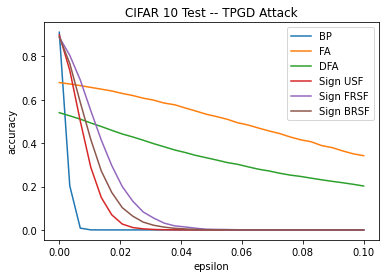

In [15]:
plot_accuracy(epsilons, 
              [
                  robust_accuracy_bp,
                  robust_accuracy_fa, 
                  robust_accuracy_dfa, 
                  robust_accuracy_sign_usf,
                  robust_accuracy_sign_frsf,
                  robust_accuracy_sign_brsf,
                            ], 
              ['BP', 'FA', 'DFA', 'Sign USF', 'Sign FRSF', 'Sign BRSF'],
              'CIFAR 10 Test -- TPGD Attack',
             'epsilon')

### Run the APGD attack on a batch of the test set

In [17]:
images, labels = iter(test_dataloader).next()

In [18]:
adv_images_fa, success_fa, accuracy_clean_fa, accuracy_robust_fa = apply_attack_on_batch(model_fa, images, labels, attack_fa, device)
plot_images_fa = images[success_fa]
plot_images_adv_fa = adv_images_fa[success_fa]

Clean Accuracy on Batch: 0.6875%
Robust Accuracy on Batch: 0.3359375%


In [19]:
adv_images_bp, success_bp, accuracy_clean_bp, accuracy_robust_bp = apply_attack_on_batch(model_bp, images, labels, attack_bp, device)
plot_images_bp = images[success_bp]
plot_images_adv_bp = adv_images_bp[success_bp]

Clean Accuracy on Batch: 0.921875%
Robust Accuracy on Batch: 0.0%


In [20]:
adv_images_sign_usf, success_sign_usf, accuracy_clean_sign_usf, accuracy_robust_sign_usf = \
    apply_attack_on_batch(model_sign_usf, images, labels, attack_sign_usf, device)
plot_images_sign_usf = images[success_sign_usf]
plot_images_adv_sign_usf = adv_images_sign_usf[success_sign_usf]

Clean Accuracy on Batch: 0.9453125%
Robust Accuracy on Batch: 0.0%


In [21]:
adv_images_sign_brsf, success_sign_brsf, accuracy_clean_sign_brsf, accuracy_robust_sign_brsf = \
    apply_attack_on_batch(model_sign_brsf, images, labels, attack_sign_brsf, device)
plot_images_sign_brsf = images[success_sign_brsf]
plot_images_adv_sign_brsf = adv_images_sign_brsf[success_sign_brsf]

Clean Accuracy on Batch: 0.9140625%
Robust Accuracy on Batch: 0.0%


In [22]:
adv_images_sign_frsf, success_sign_frsf, accuracy_clean_sign_frsf, accuracy_robust_sign_frsf = \
    apply_attack_on_batch(model_sign_frsf, images, labels, attack_sign_frsf, device)
plot_images_sign_frsf = images[success_sign_frsf]
plot_images_adv_sign_frsf = adv_images_sign_frsf[success_sign_frsf]

Clean Accuracy on Batch: 0.9140625%
Robust Accuracy on Batch: 0.0%


In [23]:
adv_images_dfa, success_dfa, accuracy_clean_dfa, accuracy_robust_dfa = apply_attack_on_batch(model_dfa, images, labels, attack_dfa, device)
plot_images_dfa = images[success_dfa]
plot_images_adv_dfa = adv_images_dfa[success_dfa]

/home/mohamed/workspace/biotorch/.venv/lib/python3.8/site-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Clean Accuracy on Batch: 0.5546875%
Robust Accuracy on Batch: 0.1640625%


### Plot the adversarial images

In [24]:
n_adv = 64

#### BP

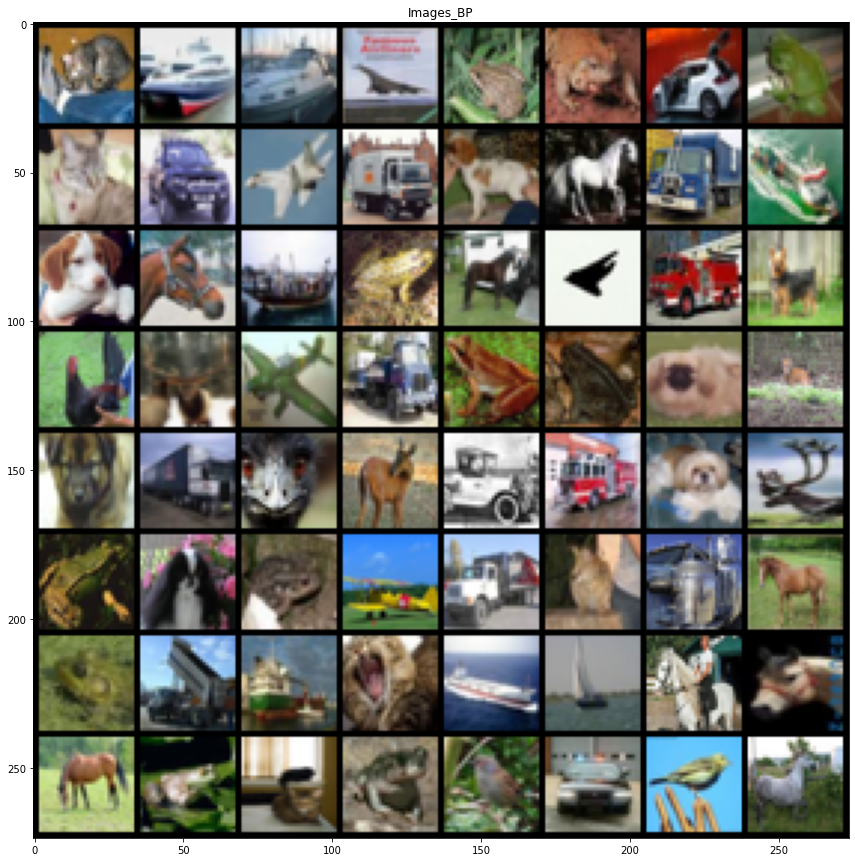

In [25]:
imshow(torchvision.utils.make_grid(plot_images_bp[0:n_adv], normalize=False), "Images_BP")

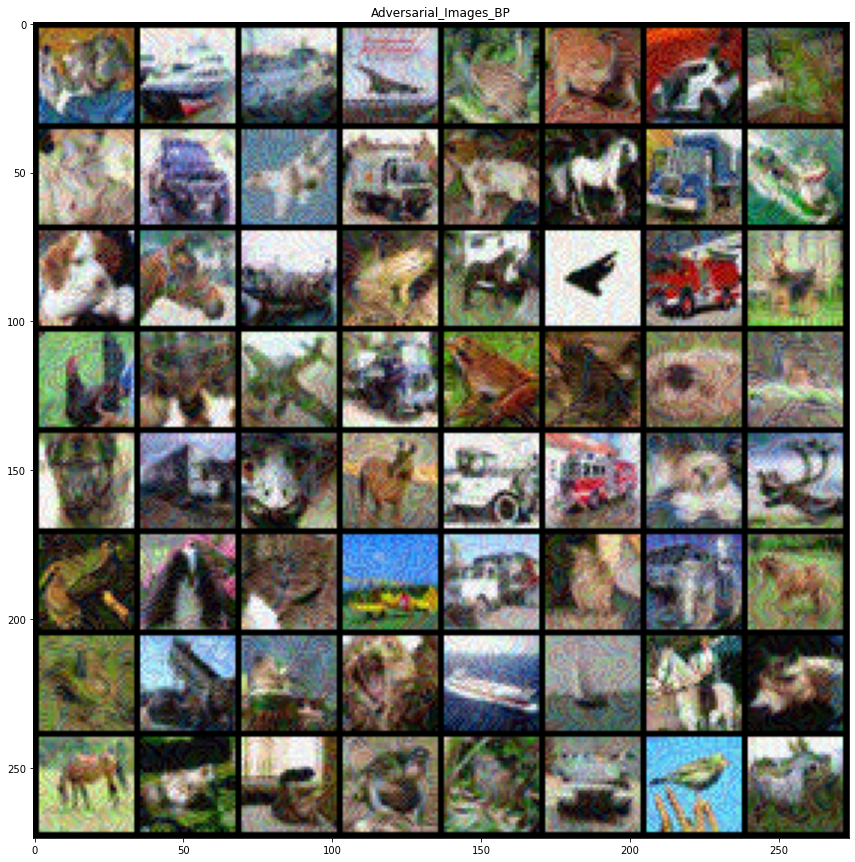

In [26]:
imshow(torchvision.utils.make_grid(plot_images_adv_bp[0:n_adv], normalize=False), "Adversarial_Images_BP")

#### FA

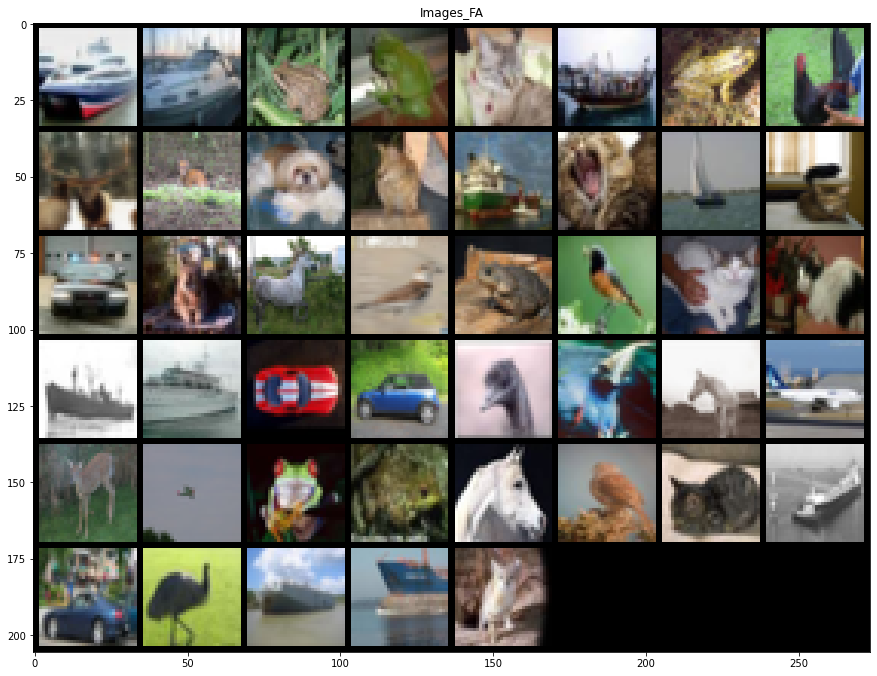

In [27]:
imshow(torchvision.utils.make_grid(plot_images_fa[0:n_adv], normalize=False), "Images_FA")

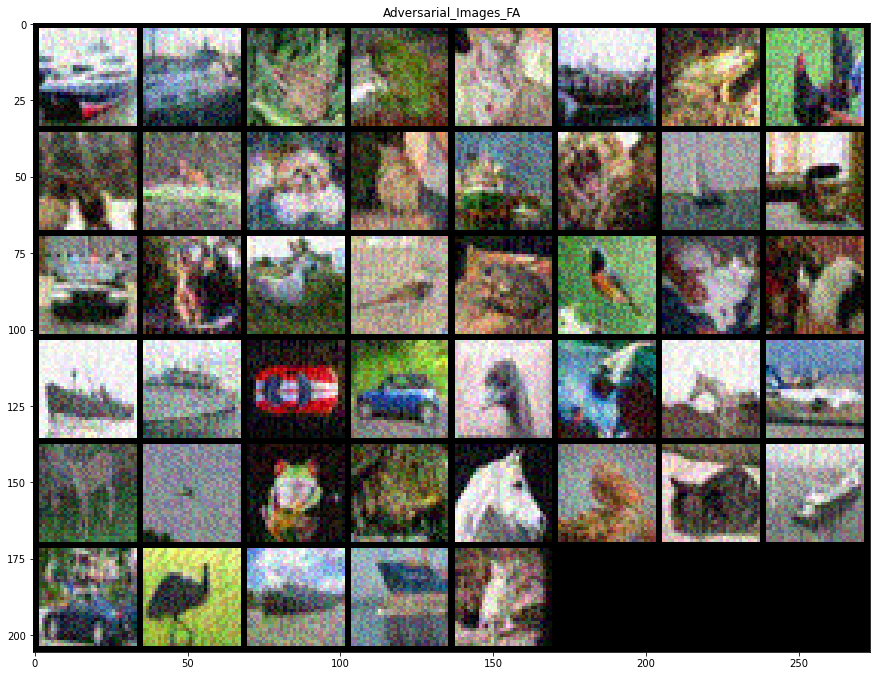

In [28]:
imshow(torchvision.utils.make_grid(plot_images_adv_fa[0:n_adv], normalize=False), "Adversarial_Images_FA")

#### DFA

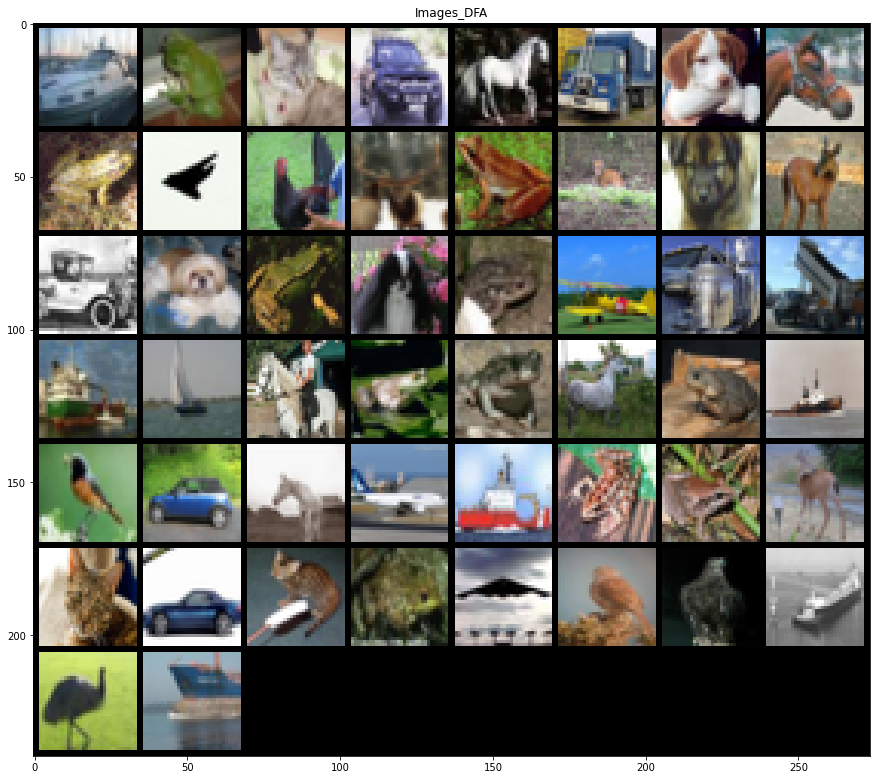

In [29]:
imshow(torchvision.utils.make_grid(plot_images_dfa[0:n_adv], normalize=False), "Images_DFA")

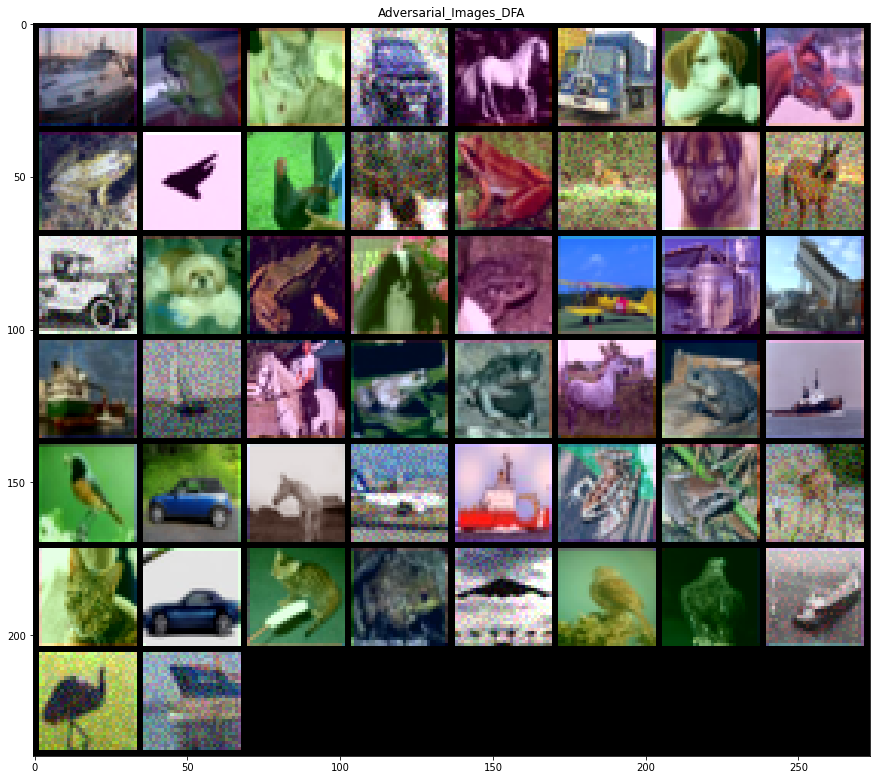

In [30]:
imshow(torchvision.utils.make_grid(plot_images_adv_dfa[0:n_adv], normalize=False), "Adversarial_Images_DFA")

#### Sign USF

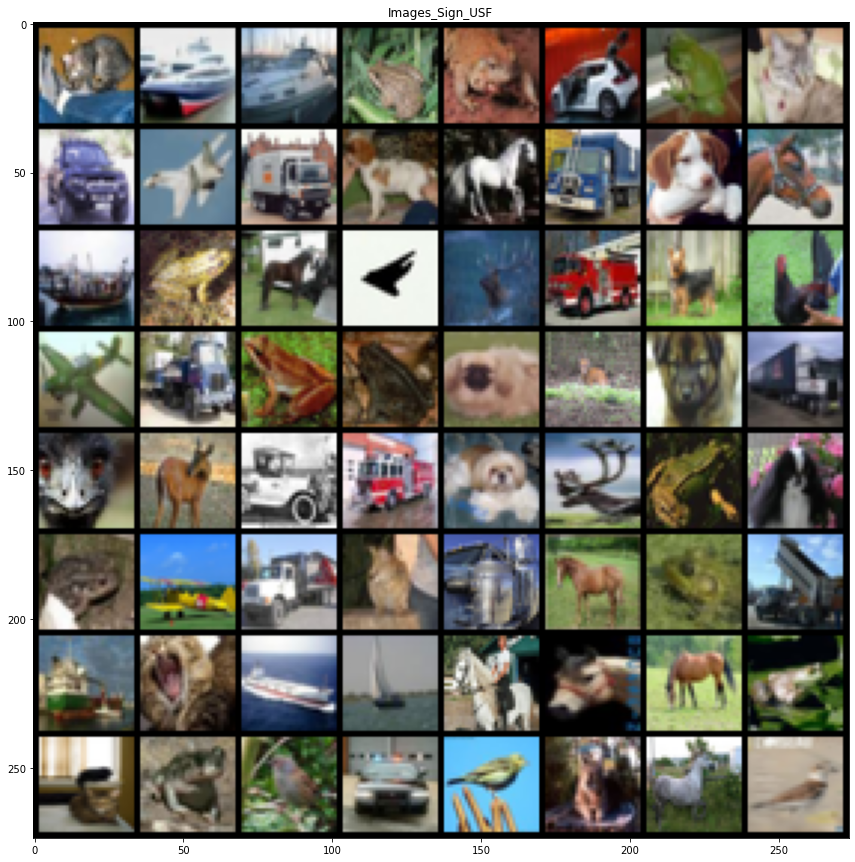

In [31]:
imshow(torchvision.utils.make_grid(plot_images_sign_usf[0:n_adv], normalize=False), "Images_Sign_USF")

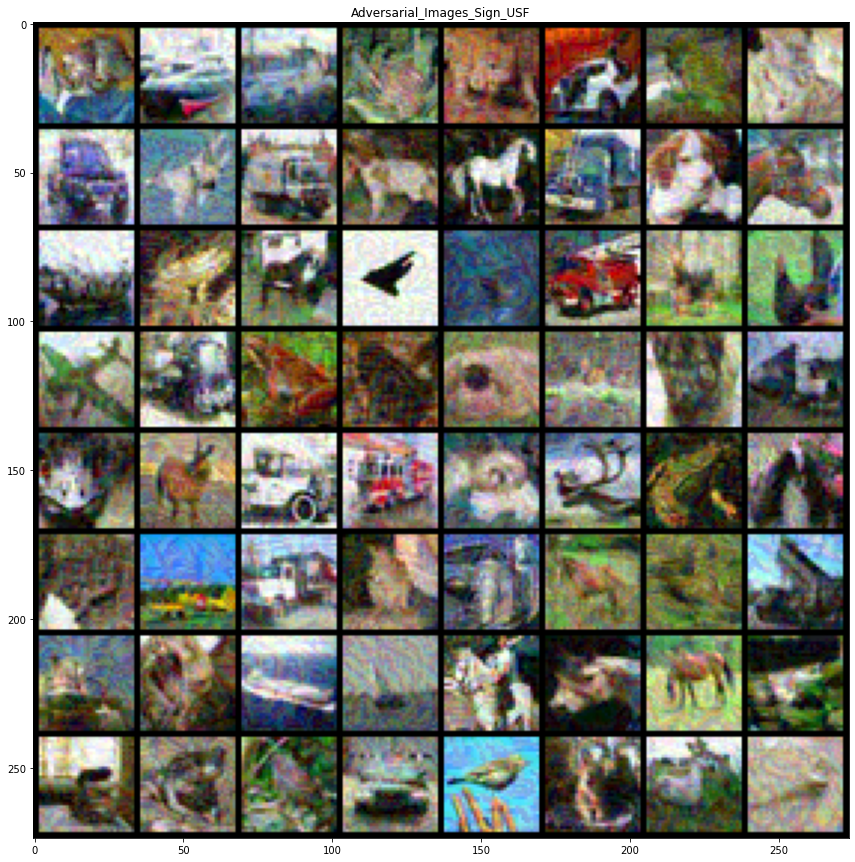

In [32]:
imshow(torchvision.utils.make_grid(plot_images_adv_sign_usf[0:n_adv], normalize=False), "Adversarial_Images_Sign_USF")

#### Sign BRSF

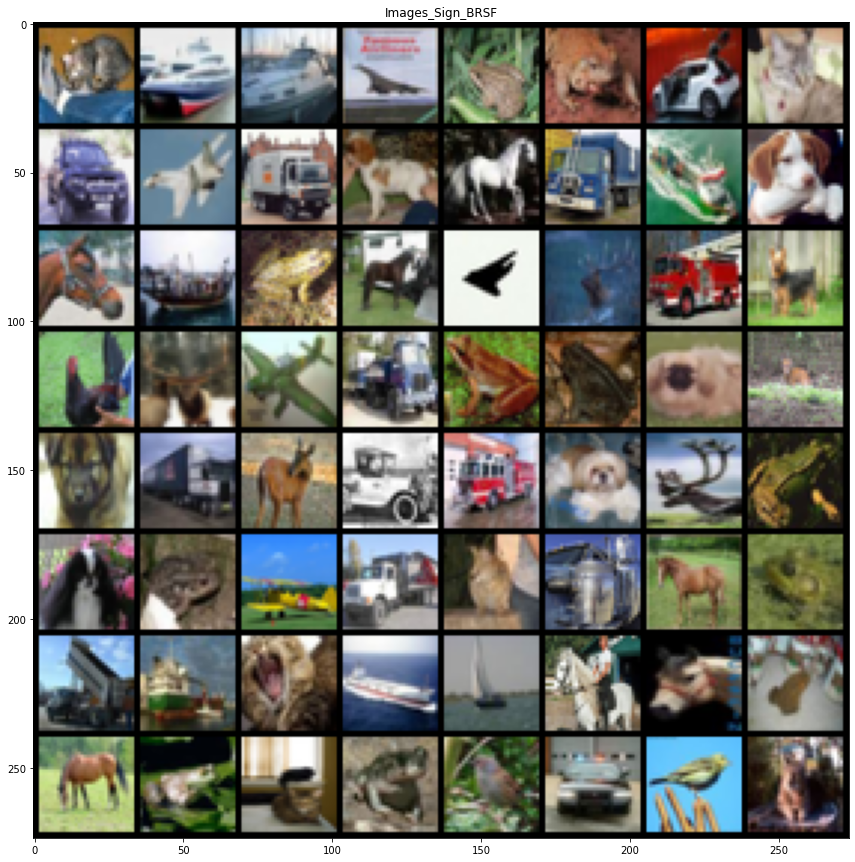

In [33]:
imshow(torchvision.utils.make_grid(plot_images_sign_brsf[0:n_adv], normalize=False), "Images_Sign_BRSF")

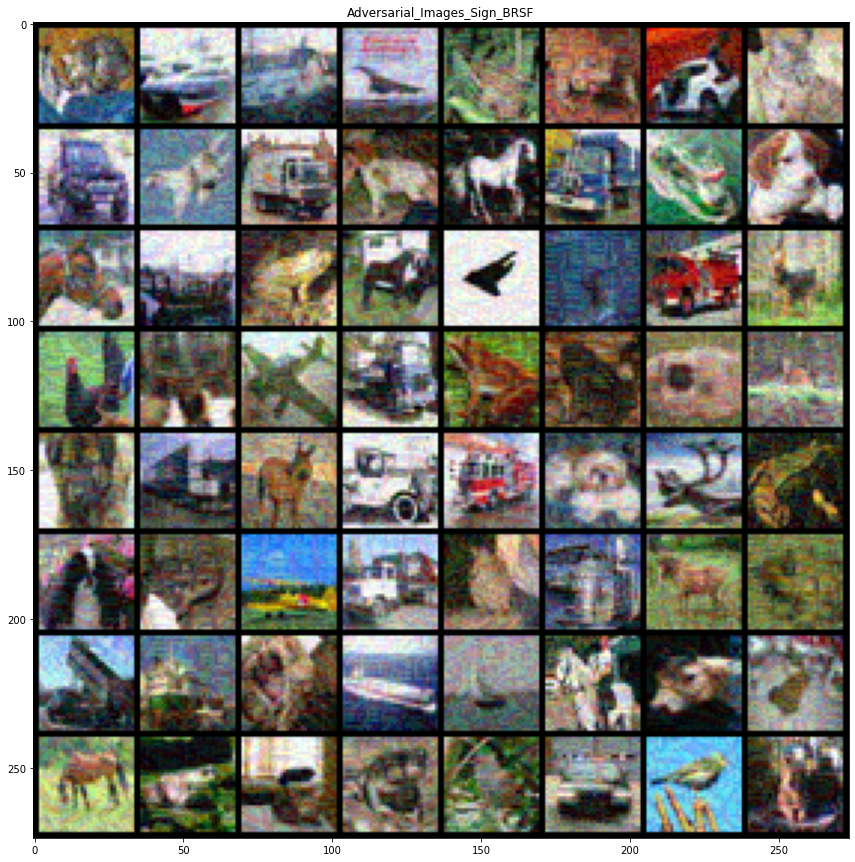

In [34]:
imshow(torchvision.utils.make_grid(plot_images_adv_sign_brsf[0:n_adv], normalize=False), "Adversarial_Images_Sign_BRSF")

#### Sign FRSF

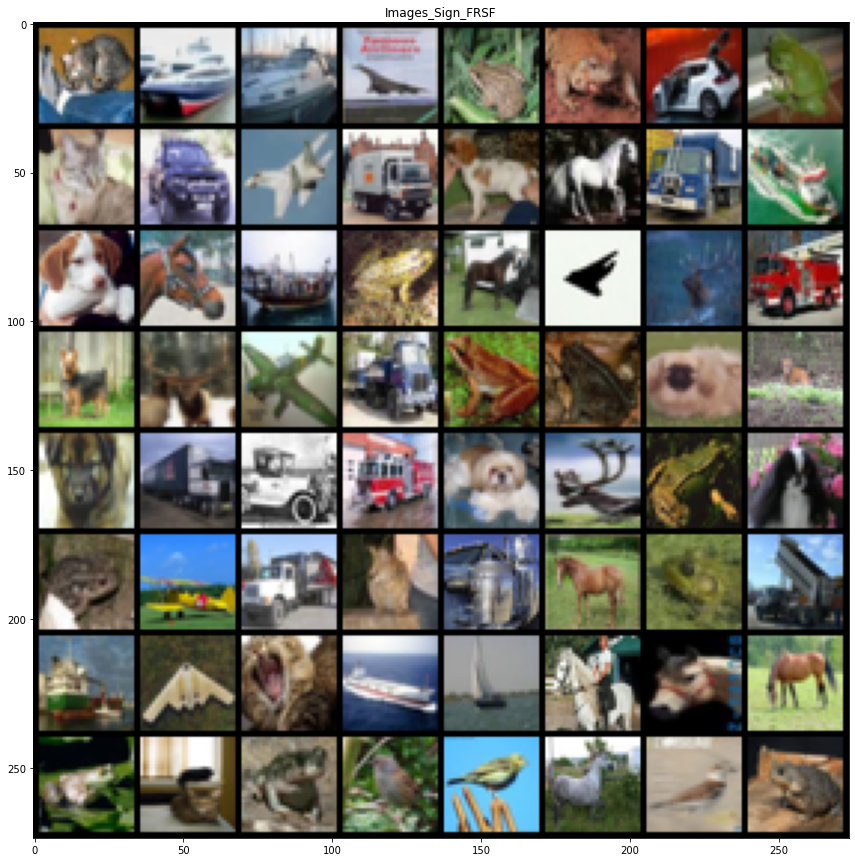

In [35]:
imshow(torchvision.utils.make_grid(plot_images_sign_frsf[0:n_adv], normalize=False), "Images_Sign_FRSF")

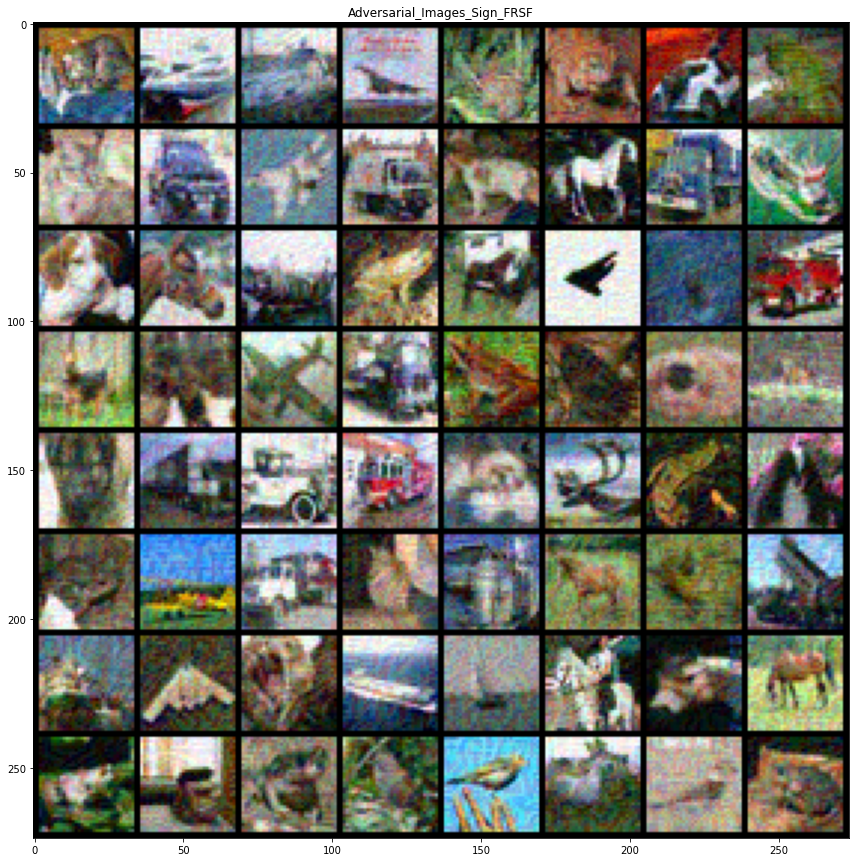

In [36]:
imshow(torchvision.utils.make_grid(plot_images_adv_sign_frsf[0:n_adv], normalize=False), "Adversarial_Images_Sign_FRSF")